# Predicting and Visualizing Urban Climate Futures

Author: Shuang Gao  


## Objective: 
To analyze geospatial and climate data, predict urban heat dynamics, and create insightful visualizations using advanced Python libraries.


## Motivation:

As urban areas continue to expand, they face increasing heat stress due to the combined effects of climate change and reduced natural vegetation. This phenomenon, known as the Urban Heat Island (UHI) effect, leads to significantly higher temperatures in cities compared to their rural surroundings, causing increased energy consumption, poorer air quality, and heightened health risks.

This project aims to analyze and predict UHI effects in Austin, Texas, by integrating advanced remote sensing and machine learning techniques. Specifically, the project uses:

    - NDVI (calculated from Landsat Surface Reflectance Bands 4 and 5) to measure vegetation cover, which plays a crucial role in mitigating urban heat.
    - Thermal Infrared Band 10 to quantify surface temperature, allowing the identification of urban heat islands and temperature variability.
    - Land Cover Classification derived from multiple surface reflectance bands (Bands 1–7) to understand the impact of different land use types on urban heat.



## Analysis:

1. Urban Heat Island (UHI) Analysis:

The phenomenon where urban areas are significantly warmer than surrounding rural areas due to human activities, reduced vegetation, and heat-absorbing materials (e.g., concrete, asphalt).  

- Purpose:  
Identify areas with higher temperatures in urban regions.  
Study the correlation between vegetation, land use, and heat patterns.  
Help design mitigation strategies like increasing green spaces.  
- Key Metrics:  
Land Surface Temperature (LST): Extracted from thermal infrared channels of satellite imagery.  
NDVI (explained below): Used to measure vegetation density and its cooling effects.  

2. NDVI (Normalized Difference Vegetation Index) Analysis:  

NDVI quantifies vegetation health and density using satellite imagery.
- Formula:
NDVI = (NIR−Red)/(NIR+Red)
NDVI= (NIR+Red)/(NIR−Red)

NIR (Near-Infrared Band): Reflects vegetation strongly.
Red Band: Absorbed by vegetation during photosynthesis.
- Purpose:
Assess vegetation cover and its role in mitigating urban heat.
Monitor deforestation, agricultural health, or urban development.
- Use in UHI:
NDVI can be correlated with temperature to assess how vegetation reduces heat.

3. Land Cover Classification Analysis:

What It Is: Land cover classification categorizes areas in a satellite image into types like water, vegetation, built-up areas, or bare soil.
Purpose:
Map how land use affects climate and temperature.
Understand urban expansion and its environmental impacts.
Approach:
Use pixel-wise classification algorithms (e.g., Random Forest, U-Net) to classify satellite imagery into land cover types.



## Dataset:
USGS EarthExplorer (Landsat imagery): To analyze urban growth, vegetation loss, and land surface temperatures.


## Import Libraries

In [35]:
# Standard libraries
import numpy as np
import pandas as pd
import datetime as dt
from datetime import datetime, timedelta
from collections import Counter, defaultdict
from itertools import cycle
import os
import subprocess
import re
import glob

from meteostat import Point, Daily
from datetime import datetime,timedelta
from scipy.ndimage import gaussian_filter

import shutil
# Visualization
from PIL import Image
import imageio  # For GIF creation
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import cm
import seaborn as sns
import cartopy.crs as ccrs

import cartopy.feature as cfeature
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d

from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import ListedColormap, BoundaryNorm
import plotly.figure_factory as ff
# Geospatial processing
import geopandas as gpd
import rasterio
from rasterio.merge import merge
from rasterio.plot import show
from rasterio.plot import plotting_extent
from rasterio.transform import from_bounds
from rasterio.warp import transform_bounds
from rasterio.enums import Resampling

import folium
from folium.plugins import MarkerCluster, HeatMap

# Data handling
import xarray as xr
from scipy import stats, sparse, ndimage
from scipy.sparse.linalg import lgmres
from scipy.interpolate import griddata


# Workflow


## Data Acquisition and Preprocessing

**please copy the files (the Data folder) from UT Box to current path**

There should be a folder named Data.

In [19]:
urldata='https://utexas.box.com/s/f4o4aeydtpfktlu9yvr9qbdedlhdtvwj'


**Landsat 4-9 Collection 2 U.S. ARD (Analysis Ready Data)**
It includes pre-processed data that is optimized for surface reflectance and temperature analyses. Our tasks:

- Urban Heat Island (UHI) Analysis: Using Band 10 (Thermal Infrared) from surface temperature to calculate temperature differences across urban and rural areas.
- Normalized Difference Vegetation Index (NDVI): Using Bands 4 (Red) and 5 (near-infrared, NIR) from surface reflectance to assess vegetation health.
- Land Cover Classification: Using multiple bands (Bands 1-7) from surface reflectance to classify land cover types (e.g., urban, forest, water).

Download from https://earthexplorer.usgs.gov/  
AOI: Centred at Austin (30.25921547660607, -97.74810791015625), radius = 70km  
Date: 05/01/2023 to 05/01/2024  
Cloud Cover Range: <=10%  
Dataset: Landsat C2 U.S. Analysis Ready Data (ARD): Landsat 4-9 C2 U.S. ARD  


download and extract Landsat U.S. ARD data
to surface_temperature and surface_reflectance folders
surface_reflectance_dir: Data/surface_reflectance

In [231]:

# Define the base directory
base_directory = './Data'  # Adjust the path as needed

def list_directory_structure(directory):
    for root, dirs, files in os.walk(directory):
        print(root)
        level = root.replace(directory, '').count(os.sep)
        indent = ' ' * 4 * level
        print(f"{indent}{os.path.basename(root)}/")
        # sub_indent = ' ' * 4 * (level + 1)
        # for file in files:
        #     print(f"{sub_indent}{file}")

# List the directory structure
list_directory_structure(base_directory)


./Data
Data/
./Data/Urban_Rural_Comparison0
    Urban_Rural_Comparison0/
./Data/UHI_analysis
    UHI_analysis/
./Data/UHI_analysis/visuals
        visuals/
./Data/UHI_analysis/output
        output/
./Data/UHI_analysis/input
        input/
./Data/Land_Cover
    Land_Cover/
./Data/Land_Cover/output
        output/
./Data/Land_Cover/output/Masks
            Masks/
./Data/surface_reflectance
    surface_reflectance/
./Data/surface_reflectance/LC09_CU_015017_20230904_20230909_02_SR
        LC09_CU_015017_20230904_20230909_02_SR/
./Data/surface_reflectance/LC08_CU_016016_20231124_20231202_02_SR
        LC08_CU_016016_20231124_20231202_02_SR/
./Data/surface_reflectance/LC08_CU_015017_20240127_20240211_02_SR
        LC08_CU_015017_20240127_20240211_02_SR/
./Data/surface_reflectance/LC09_CU_015017_20231015_20231019_02_SR
        LC09_CU_015017_20231015_20231019_02_SR/
./Data/surface_reflectance/LC09_CU_015016_20231225_20231229_02_SR
        LC09_CU_015016_20231225_20231229_02_SR/
./Data/surfac

In [2]:
# Define the base data directory and extraction directories
base_dir = "./Data"  # Base directory for all data
surfRefFolder = "surface_reflectance"
surfTempFolder = "surface_temperature"
surface_reflectance_dir = os.path.join(base_dir, surfRefFolder)   # raw tar files will be extracted into subfolders to this folder
surface_temperature_dir = os.path.join(base_dir, surfTempFolder) # raw tar files will be extracted into subfolders to this folder
LandCoverFolder= "Land_Cover"
LandCover_dir = os.path.join(base_dir, LandCoverFolder)  # GeoTiff will be extracted to this folder

# Ensure the extraction directories exist under "Data"
os.makedirs(surface_reflectance_dir, exist_ok=True)
os.makedirs(surface_temperature_dir, exist_ok=True)

In [ ]:
# Process Surface Reflectance TAR files
for file in os.listdir(base_dir):
    if file.endswith("_SR.tar"):  # Check for Surface Reflectance TAR files
        folder_name = os.path.join(surface_reflectance_dir, os.path.splitext(file)[0])
        os.makedirs(folder_name, exist_ok=True)
        print(f"Extracting {file} into {folder_name}...")
        subprocess.run(["tar", "-xvf", os.path.join(base_dir, file), "-C", folder_name])

# Process Surface Temperature TAR files
for file in os.listdir(base_dir):
    if file.endswith("_ST.tar"):  # Check for Surface Temperature TAR files
        folder_name = os.path.join(surface_temperature_dir, os.path.splitext(file)[0])
        os.makedirs(folder_name, exist_ok=True)
        print(f"Extracting {file} into {folder_name}...")
        subprocess.run(["tar", "-xvf", os.path.join(base_dir, file), "-C", folder_name])

print("Extraction complete!")


Now the file structure is:  
Project Directory/  
├── notebook.ipynb  
├── Data/  
│   ├── surface_reflectance/  
│   │   ├── LC08_CU_015016_20230818_20230829_02_SR/  
│   │   │   ├── metadata.json  
│   │   │   ├── metadata.xml  
│   │   │   ├── B1.tif  
│   │   │   ├── ...  
│   ├── surface_temperature/  
│   │   ├── LC08_CU_015016_20230818_20230829_02_ST/  
│   │   │   ├── metadata.json  
│   │   │   ├── metadata.xml  
│   │   │   ├── B10.tif  
│   │   │   ├── ...  
│   ├── LC08_CU_015016_20230818_20230829_02_SR.tar  
│   ├── LC08_CU_015016_20230818_20230829_02_ST.tar


Goals:

Urban Heat Island (UHI):  
Requires:
Surface Temperature Data (included in U.S. ARD).
Covered by: Landsat 4-9 C2 U.S. ARD (Surface Temperature).

NDVI Analysis:
Requires:
Surface Reflectance Data (Red and NIR bands).
Covered by: Landsat 4-9 C2 U.S. ARD (Surface Reflectance).

Land Cover Classification:
Requires:
Multi-band Surface Reflectance Data (visible and infrared bands).
Covered by: Landsat 4-9 C2 U.S. ARD.

Optional Analysis Goals:  
Dynamic Surface Water Extent:  
If you plan to assess water bodies' cooling effect or flooding risks, this is a useful dataset.

Fractional Snow Covered Area:

Now I have 177 surface_reflectance data points and 177 surface_temperature data points. 
File name explanation: e.g. LC09_CU_015016_20230531_20230605_02_SR

LC09:

Refers to Landsat 9 (the satellite that captured the data).
If it were LC08, it would mean Landsat 8.
CU:

Indicates that this is U.S. Landsat ARD (Analysis Ready Data).
015016:

These are the grid coordinates in the Worldwide Reference System (WRS-2):
015: Horizontal tile number.
016: Vertical tile number.
20230531_20230605:

Represents the temporal range of acquisition:
20230531: The start date (May 31, 2023).
20230605: The end date (June 5, 2023).
This indicates the data is a composite or aggregation of observations over this date range.
02:

Refers to the processing version of the data (e.g., updates to processing methods).
_SR:

Indicates that this is the Surface Reflectance product.

The files are available for each duration (5-7 days).   
issue: for some dates, there are only 1 or 2 tiles. I want to filter them out, and only keep those tiles with 3 to 4 tiles.

### filter data
count number of tiles per date and get bi-weekly 4 tile data  
temperature_4tilesdir: Data/surface_temperature_4_tiles  
reflectance_4tilesdir: Data/surface_reflectance_4_tiles

The following should be run but due to too large data, I make it as markdown cell

In [3]:
# Function to count tiles by date
def count_tiles_by_date(directory, pattern):
    counts = defaultdict(int)
    dates = set()
    for file in os.listdir(directory):
        match = re.search(pattern, file)
        if match:
            date = match.group(1)  # Extract the starting date from filename
            counts[date] += 1
            dates.add(date)
    return counts, sorted(list(dates))

# Define regex patterns for extracting dates from filenames
pattern = r'_(\d{8})_'  # Matches date in YYYYMMDD format

# Count tiles for surface temperature and reflectance
temp_counts, temp_dates = count_tiles_by_date(surface_temperature_dir, pattern)
reflectance_counts, reflectance_dates = count_tiles_by_date(surface_reflectance_dir, pattern)

# Merge dates and ensure alignment
all_dates = sorted(set(temp_dates).union(set(reflectance_dates)))
temp_values = [temp_counts.get(date, 0) for date in all_dates]
reflectance_values = [reflectance_counts.get(date, 0) for date in all_dates]

# Convert dates to datetime for plotting
all_dates_dt = [datetime.strptime(date, "%Y%m%d") for date in all_dates]


In [152]:
len(temp_counts)

82

### Collect and clean date coverage information
1. Parse folder name and get date, quadrant, satellite info ( --> coverage_info)
2. Remove data that is a time span for more than one month 
3. keep those date with 4 tiles covered 
4. keep only 1 date every 10+ days.

In [4]:
# 1. Parse folder name and get date, quadrant, satellite info ( --> coverage_info)
base_directory = "./Data/surface_temperature"
# Extract information from folder names
folders = os.listdir(base_directory)
coverage_info = []
# Regular expression to parse folder names
pattern = r"(LC\d{2})_CU_(\d{6})_(\d{8})_(\d{8})_\d{2}_ST"
for folder in folders:
    match = re.match(pattern, folder)
    if match:
        satellite = match.group(1)  # LC08 or LC09
        location_code = match.group(2)  # Location code (e.g., 015016, 016017)
        start_date = datetime.strptime(match.group(3), "%Y%m%d")
        end_date = datetime.strptime(match.group(4), "%Y%m%d")
        coverage_info.append((satellite, location_code, start_date, end_date))
coverage_info.sort(key=lambda x: x[2])


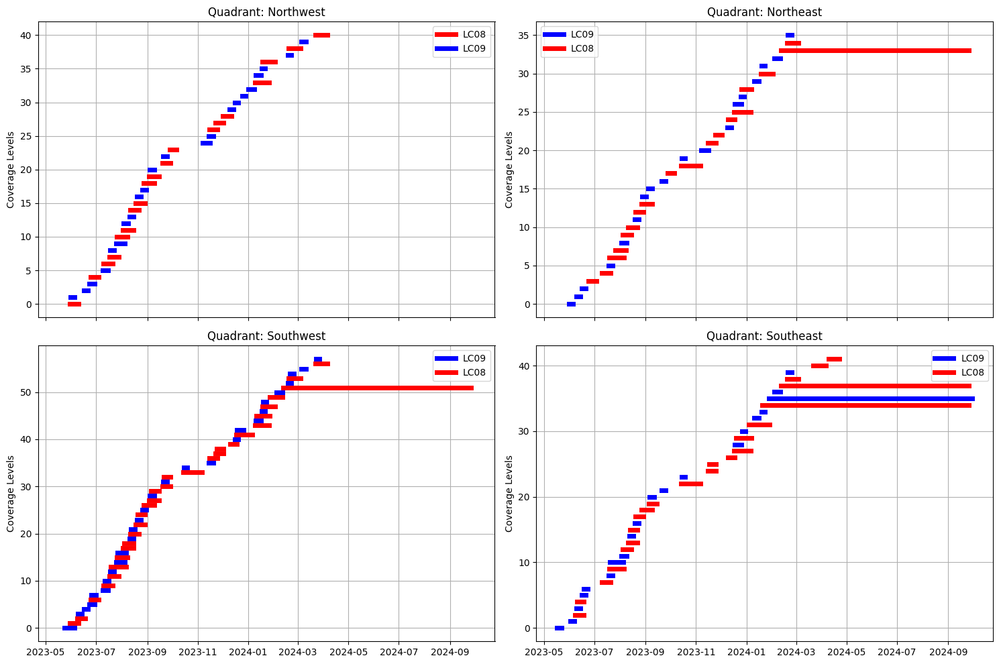

In [5]:
# Quadrants to consider
quadrants = ["015016",  "016016", "015017","016017"]   
quadrantName = ["Northwest", "Northeast", "Southwest","Southeast"]
y_levels = [0, 0, 0, 0]

# Create a figure with 4 subplots (2x2 layout)
fig, axes = plt.subplots(2, 2, figsize=(15, 10), sharex=True)
axes = axes.flatten()

# Plot each quadrant in a separate subplot
for i, quadrant in enumerate(quadrants):
    ax = axes[i]
    height = 1  # Height for each step
    y_levels[i] = 0  # Initial level for stacking the steps

    # Track whether labels have been added for each satellite
    label_added = {"LC08": False, "LC09": False}

    for entry in coverage_info:
        satellite, location_code, start_date, end_date = entry
        if location_code == quadrant:
            # Set color based on satellite type
            if satellite == 'LC08':
                col = 'red'
                label = "LC08" if not label_added['LC08'] else None
                height=1
            else:
                col = 'blue'
                label = "LC09" if not label_added['LC09'] else None
                height=1

            # Plot line with the appropriate label
            ax.plot([start_date, end_date], [y_levels[i], y_levels[i]], linewidth=5, color=col, label=label)
            y_levels[i] += height

            # Update label tracking
            if satellite == 'LC08':
                label_added['LC08'] = True
            elif satellite == 'LC09':
                label_added['LC09'] = True

    # Set title and labels for each subplot
    ax.set_title(f"Quadrant: {quadrantName[i]}")
    # ax.set_xlabel("Date")
    ax.set_ylabel("Coverage Levels")
    ax.grid(True)

    # Add legend to each subplot, showing only "LC08" and "LC09"
    ax.legend()

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()

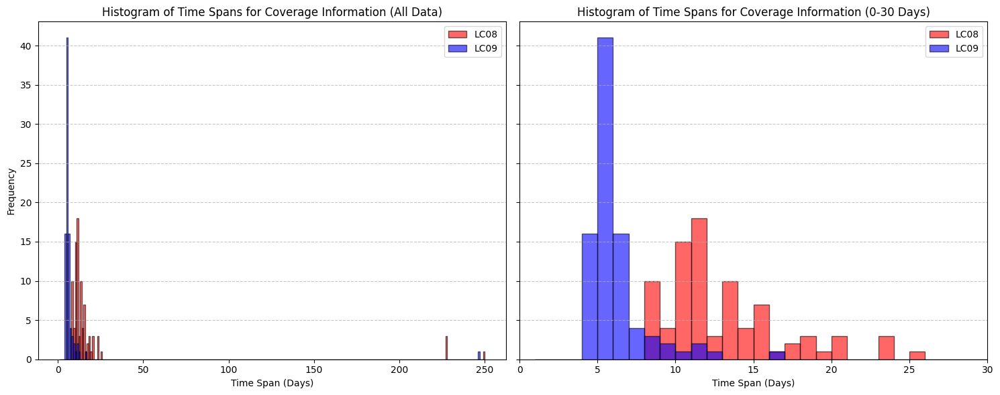

In [6]:
# plot a histogram of the time span


# Separate the time spans for LC08 and LC09
time_spans_lc08 = [(entry[3] - entry[2]).days for entry in coverage_info if entry[0] == 'LC08']
time_spans_lc09 = [(entry[3] - entry[2]).days for entry in coverage_info if entry[0] == 'LC09']

# Create a 1x2 subplot layout
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# Plot the whole histogram on the left
axes[0].hist(time_spans_lc08, bins=range(1, max(time_spans_lc08 + time_spans_lc09) + 1), color='red', alpha=0.6, label='LC08', edgecolor='black')
axes[0].hist(time_spans_lc09, bins=range(1, max(time_spans_lc08 + time_spans_lc09) + 1), color='blue', alpha=0.6, label='LC09', edgecolor='black')
axes[0].set_xlabel('Time Span (Days)')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Histogram of Time Spans for Coverage Information (All Data)')
axes[0].legend()
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Plot the histogram with time spans between 0 and 30 days on the right
axes[1].hist(time_spans_lc08, bins=range(1, 31), color='red', alpha=0.6, label='LC08', edgecolor='black')
axes[1].hist(time_spans_lc09, bins=range(1, 31), color='blue', alpha=0.6, label='LC09', edgecolor='black')
axes[1].set_xlabel('Time Span (Days)')
axes[1].set_title('Histogram of Time Spans for Coverage Information (0-30 Days)')
axes[1].set_xlim([0, 30])
axes[1].legend()
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()




**Now for every date, its number of tiles is calculated. I will keep those with 4 tiles, and keep only 1 data every 15 days.**

In [7]:
# Remove data that is a time span for more than one month
filtered_coverage_info = [
    entry for entry in coverage_info 
    if (entry[3] - entry[2]) <= timedelta(days=15)
]
# filtered_coverage_info

In [11]:
len(filtered_coverage_info)

157

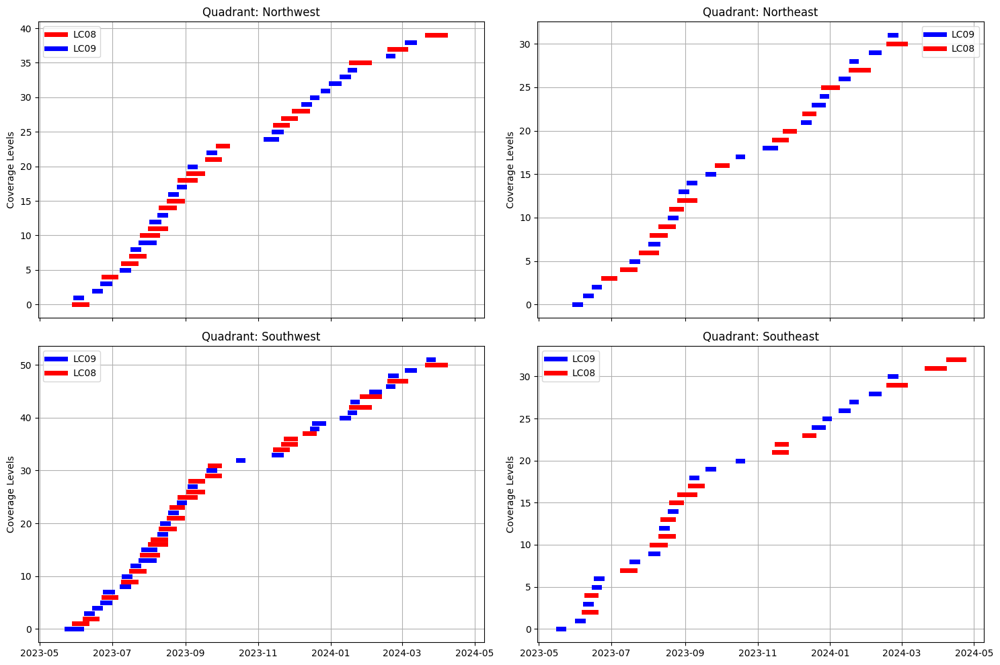

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10), sharex=True)
axes = axes.flatten()

# Plot each quadrant in a separate subplot
for i, quadrant in enumerate(quadrants):
    ax = axes[i]
    height = 1  # Height for each step
    y_levels[i] = 0  # Initial level for stacking the steps

    # Track whether labels have been added for each satellite
    label_added = {"LC08": False, "LC09": False}

    for entry in filtered_coverage_info:
        satellite, location_code, start_date, end_date = entry
        if location_code == quadrant:
            # Set color based on satellite type
            if satellite == 'LC08':
                col = 'red'
                label = "LC08" if not label_added['LC08'] else None
                height=1
            else:
                col = 'blue'
                label = "LC09" if not label_added['LC09'] else None
                height=1

            # Plot line with the appropriate label
            ax.plot([start_date, end_date], [y_levels[i], y_levels[i]], linewidth=5, color=col, label=label)
            y_levels[i] += height

            # Update label tracking
            if satellite == 'LC08':
                label_added['LC08'] = True
            elif satellite == 'LC09':
                label_added['LC09'] = True

    # Set title and labels for each subplot
    ax.set_title(f"Quadrant: {quadrantName[i]}")
    # ax.set_xlabel("Date")
    ax.set_ylabel("Coverage Levels")
    ax.grid(True)

    # Add legend to each subplot, showing only "LC08" and "LC09"
    ax.legend()

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()


In [9]:
CoverageList08 = {}  # record coverage list for LC08
CoverageList09 = {}  # record coverage list for LC09

# Loop through the filtered coverage info
for entry in filtered_coverage_info:
    satellite, location_code, start_date, end_date = entry

    if satellite == "LC08":
        # If start_date is not yet in the CoverageList08, add it with the initial location and end date
        if start_date not in CoverageList08:
            CoverageList08[start_date] = [[location_code], end_date]
        # If start_date is already there, and the location is not in the list of quadrants, add it
        elif location_code not in CoverageList08[start_date][0]:
            CoverageList08[start_date][0].append(location_code)

    elif satellite == "LC09":
        # If start_date is not yet in the CoverageList09, add it with the initial location and end date
        if start_date not in CoverageList09:
            CoverageList09[start_date] = [[location_code], end_date]
        # If start_date is already there, and the location is not in the list of quadrants, add it
        elif location_code not in CoverageList09[start_date][0]:
            CoverageList09[start_date][0].append(location_code)

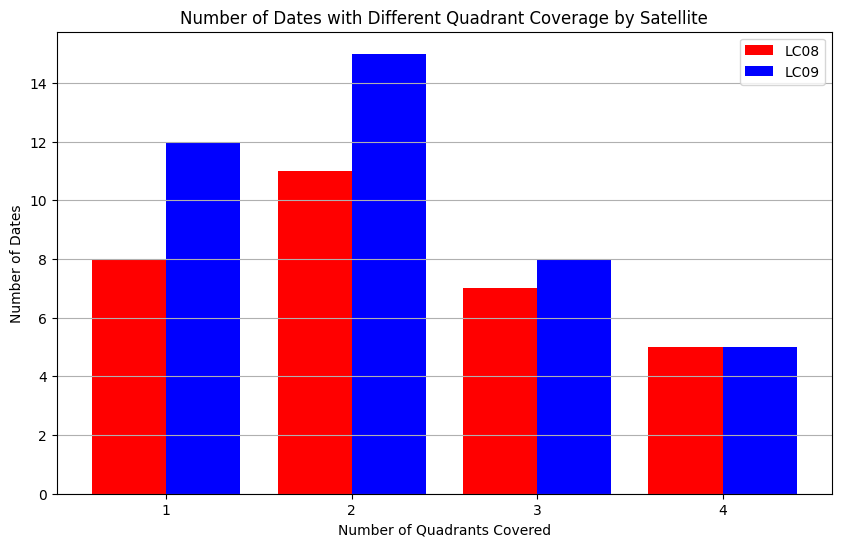

In [11]:
import matplotlib.pyplot as plt
from collections import defaultdict

# Step 1: Create a dictionary that tracks the coverage count for each date for each satellite
date_coverage_count = defaultdict(lambda: {"LC08": 0, "LC09": 0})

# Step 2: Count the coverage per date per satellite
for entry in filtered_coverage_info:
    satellite, location_code, start_date, end_date = entry
    current_date = start_date
    while current_date <= end_date:
        date_coverage_count[current_date][satellite] += 1
        current_date += timedelta(days=1)

CoverageList08 = {}  # record coverage list for LC08
CoverageList09 = {}  # record coverage list for LC09

# Loop through the filtered coverage info
for entry in filtered_coverage_info:
    satellite, location_code, start_date, end_date = entry

    if satellite == "LC08":
        # If start_date is not yet in the CoverageList08, add it with the initial location and end date
        if start_date not in CoverageList08:
            CoverageList08[start_date] = [[location_code], end_date]
        # If start_date is already there, and the location is not in the list of quadrants, add it
        elif location_code not in CoverageList08[start_date][0]:
            CoverageList08[start_date][0].append(location_code)

    elif satellite == "LC09":
        # If start_date is not yet in the CoverageList09, add it with the initial location and end date
        if start_date not in CoverageList09:
            CoverageList09[start_date] = [[location_code], end_date]
        # If start_date is already there, and the location is not in the list of quadrants, add it
        elif location_code not in CoverageList09[start_date][0]:
            CoverageList09[start_date][0].append(location_code)
            
# Step 3: Calculate how many dates have 1, 2, 3, or 4 quadrants covered        
FullCoverageList = {}
coverage_count_lc08 = [0, 0, 0, 0]
coverage_count_lc09 = [0, 0, 0, 0]

for start_date, value in CoverageList08.items():
    locationlist, end_date = value
    lenq = len(locationlist)
    
    # Update the count for LC08 based on the number of quadrants covered
    coverage_count_lc08[lenq - 1] += 1
    
    # If all 4 quadrants are covered, add to FullCoverageList
    if lenq == 4:
        if start_date not in FullCoverageList:
            FullCoverageList[start_date] = ['LC08', end_date]

# Iterate over CoverageList09 dictionary
for start_date, value in CoverageList09.items():
    locationlist, end_date = value
    lenq = len(locationlist)
    
    # Update the count for LC09 based on the number of quadrants covered
    coverage_count_lc09[lenq - 1] += 1
    
    # If all 4 quadrants are covered, add to FullCoverageList
    if lenq == 4:
        if start_date not in FullCoverageList:
            FullCoverageList[start_date] = ['LC09', end_date]
FullCoverageList = dict(sorted(FullCoverageList.items()))

# Step 4: Plot the histogram
x_labels = [1, 2, 3, 4]

fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# Plotting LC08 and LC09 histograms side-by-side
ax.bar(
    [x - 0.2 for x in x_labels], coverage_count_lc08, width=0.4, color='red', label='LC08'
)
ax.bar(
    [x + 0.2 for x in x_labels], coverage_count_lc09, width=0.4, color='blue', label='LC09'
)

# Setting labels and title
ax.set_xlabel("Number of Quadrants Covered")
ax.set_ylabel("Number of Dates")
ax.set_xticks(x_labels)
ax.set_title("Number of Dates with Different Quadrant Coverage by Satellite")
ax.legend()

# Display the plot
plt.grid(axis='y')
plt.show()


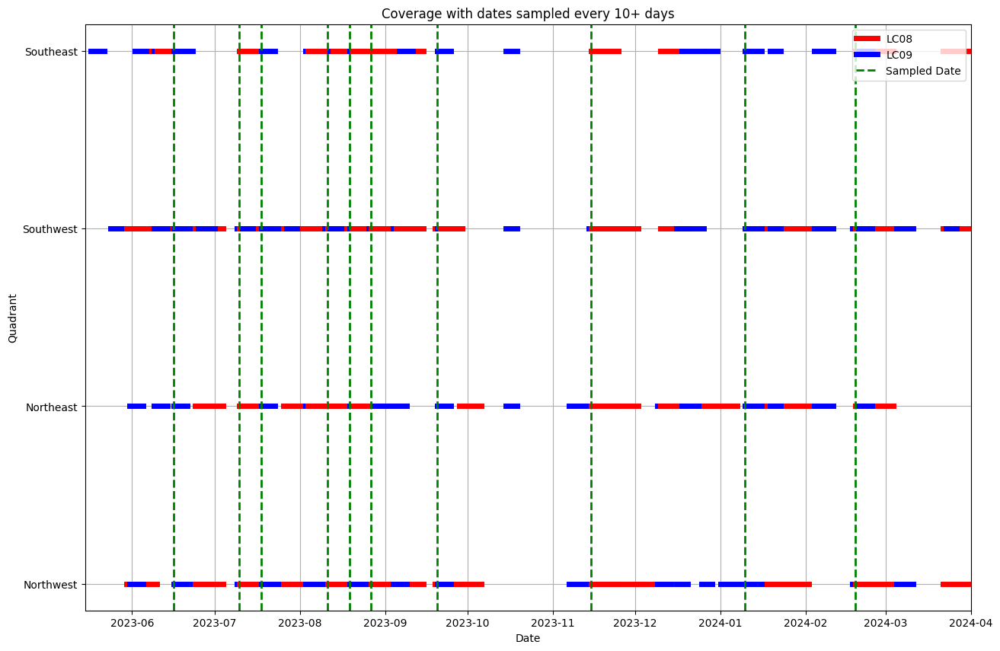

In [14]:
# Modified plot to highlight sampled dates

# Set up the plot
plt.subplots(1, 1, figsize=(15, 10))
y_levels = [0, 1, 2, 3]  # Define y levels for each quadrant

# Plotting original data for all quadrants
label_added = {"LC08": False, "LC09": False}

for i, quadrant in enumerate(quadrants):
    for entry in filtered_coverage_info:
        satellite, location_code, start_date, end_date = entry
        if location_code == quadrant:
            # Set color and label
            if satellite == 'LC08':
                col = 'red'
                label = "LC08" if not label_added['LC08'] else None                
            else:
                col = 'blue'
                label = "LC09" if not label_added['LC09'] else None

            # Plot original coverage lines
            plt.plot([start_date, end_date], [y_levels[i], y_levels[i]], linewidth=5, color=col, label=label)

            # Update label tracking
            if satellite == 'LC08':
                label_added['LC08'] = True
            elif satellite == 'LC09':
                label_added['LC09'] = True

# Highlight the sampled dates
sampled_label_added = False
# for sampled_date in sampled_dates:
#     plt.axvline(sampled_date, color='green', linestyle='--', linewidth=2, label='Sampled Date' if not sampled_label_added else "")
#     sampled_label_added = True
for sampled_date in FullCoverageList.keys():
    plt.axvline(sampled_date, color='green', linestyle='--', linewidth=2, label='Sampled Date' if not sampled_label_added else "")
    sampled_label_added = True

# Set y-axis ticks and labels
plt.yticks(ticks=[0, 1, 2, 3], labels=quadrantName)
# Set x-axis limits and grid lines at every month
plt.xlim([datetime(2023, 5, 15), datetime(2024, 4, 1)])  # Limit x-axis from June 1, 2023 to April 1, 2024
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  # Set grid lines at every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format the date as Year-Month

# Set labels, title, and legend
plt.ylabel("Quadrant")
plt.xlabel("Date")
plt.title("Coverage with dates sampled every 10+ days")
plt.grid(True)
plt.legend(loc='upper right')

# Show the plot
plt.show()


**The above plot shows the time span of each satellite in blue and red lines, and the sampled date I choose in dashed green.**

### Copy usable data
1. Keep only the necessary bands.
2. Copy only above data to new folders.



In [238]:

# Directories
base_dir = "./Data"
temp_source_dir = os.path.join(base_dir, surfTempFolder)
reflectance_source_dir = os.path.join(base_dir, surfRefFolder)

surfTemp4tilesFolder = "surface_temperature_4_tiles"
surfRef4tilesFolder = "surface_reflectance_4_tiles"
temperature_4tilesdir = os.path.join(base_dir, surfTemp4tilesFolder)
reflectance_4tilesdir = os.path.join(base_dir, surfRef4tilesFolder)


# Ensure destination folders exist
os.makedirs(temperature_4tilesdir, exist_ok=True)
os.makedirs(reflectance_4tilesdir, exist_ok=True)

def copy_relevant_files(source_dir, dest_dir, full_coverage_list, bands_to_keep):
    for start_date, (satellite, end_date) in full_coverage_list.items():
        # Loop through the folders in the source directory
        for folder in os.listdir(source_dir):
            # Extract the location code, satellite, and date range from the folder name
            folder_parts = folder.split("_")
            if len(folder_parts) < 5:
                continue  # Skip folders that do not match the expected format

            folder_satellite = folder_parts[0]
            location_code = folder_parts[2]
            folder_start_date = folder_parts[3]
            folder_end_date = folder_parts[4]

            # Check if the folder matches the desired satellite and date range
            if (
                folder_satellite == satellite and
                start_date.strftime("%Y%m%d") == folder_start_date and
                end_date.strftime("%Y%m%d") == folder_end_date
            ):
                # Define the source and destination folder paths
                src_folder = os.path.join(source_dir, folder)
                dest_folder = os.path.join(dest_dir, folder)
                os.makedirs(dest_folder, exist_ok=True)

                # Copy only relevant bands
                for file in os.listdir(src_folder):
                    for band in bands_to_keep:
                        if band in file:  # Check if file contains the relevant band
                            shutil.copy(os.path.join(src_folder, file), dest_folder)
                print(f"Copied files for {folder} to {dest_folder}")

# Call the function to copy files for Surface Temperature (e.g., Band 10 for UHI)
copy_relevant_files(temp_source_dir, temperature_4tilesdir, FullCoverageList, bands_to_keep=["_B10"])

# Call the function to copy files for Surface Reflectance (e.g., Bands 4 and 5 for NDVI, multiple for classification)
copy_relevant_files(reflectance_source_dir, reflectance_4tilesdir, FullCoverageList, bands_to_keep=["_B4", "_B5", "_B1", "_B2", "_B3", "_B6", "_B7"])



Copied files for LC09_CU_016016_20230616_20230621_02_ST to ./Data/surface_temperature_4_tiles/LC09_CU_016016_20230616_20230621_02_ST
Copied files for LC09_CU_015017_20230616_20230621_02_ST to ./Data/surface_temperature_4_tiles/LC09_CU_015017_20230616_20230621_02_ST
Copied files for LC09_CU_015016_20230616_20230621_02_ST to ./Data/surface_temperature_4_tiles/LC09_CU_015016_20230616_20230621_02_ST
Copied files for LC09_CU_016017_20230616_20230621_02_ST to ./Data/surface_temperature_4_tiles/LC09_CU_016017_20230616_20230621_02_ST
Copied files for LC08_CU_016017_20230710_20230721_02_ST to ./Data/surface_temperature_4_tiles/LC08_CU_016017_20230710_20230721_02_ST
Copied files for LC08_CU_015017_20230710_20230721_02_ST to ./Data/surface_temperature_4_tiles/LC08_CU_015017_20230710_20230721_02_ST
Copied files for LC08_CU_015016_20230710_20230721_02_ST to ./Data/surface_temperature_4_tiles/LC08_CU_015016_20230710_20230721_02_ST
Copied files for LC08_CU_016016_20230710_20230721_02_ST to ./Data/sur

### merge tiles for each date and copied to objective folders


#### set Analysis folders

In [24]:
uhi_dir =  os.path.join(base_dir, "UHI_analysis")   # Band 10 temp, Urban heat island analysis
ndvi_dir = os.path.join(base_dir, "NDVI_analysis")  # Band 4,5 ref, Normalized Difference Vegetation Index analysis
lcc_dir =  os.path.join(base_dir, "LCC_analysis")  # Band 1-7 ref, land_cover_classification analysis

output_dirs = {
    "UHI": uhi_dir,  # 
    "NDVI": ndvi_dir,
    "LCC": lcc_dir,   # 
}
# Ensure output directories exist
inputfolder = "input"
outputfolder = "output"
for dir_name, output_dir in output_dirs.items():
    os.makedirs(output_dir, exist_ok=True)
    os.makedirs(os.path.join(output_dir, inputfolder), exist_ok=True)
    os.makedirs(os.path.join(output_dir, outputfolder), exist_ok=True)


### do mosaic

In [253]:
# Function to mosaic and save files with corrected naming
def mosaic_and_save(files, output_file):
    src_files_to_mosaic = [rasterio.open(fp) for fp in files]
    mosaic, transform = merge(src_files_to_mosaic)
    # Update metadata
    meta = src_files_to_mosaic[0].meta.copy()    
    meta.update({
        "driver": "GTiff",
        "height": mosaic.shape[1],
        "width": mosaic.shape[2],
        "transform": transform,
        "count": len(mosaic),  # Update for the number of bands
    })
    # Save the mosaic
    os.makedirs(os.path.dirname(output_file), exist_ok=True)
    with rasterio.open(output_file, "w", **meta) as dest:
        dest.write(mosaic)    
    print(f"Mosaic saved to {output_file} - Height: {mosaic.shape[1]}, Width: {mosaic.shape[2]}")


def group_files_for_full_coverage_list(directory, full_coverage_list, band_identifier):
    grouped_files = defaultdict(list)
    
    for start_date, (satellite, end_date) in full_coverage_list.items():
        # Loop through the folders in the source directory
        for folder in os.listdir(directory):
            # Extract the location code, satellite, and date range from the folder name
            folder_parts = folder.split("_")
            if len(folder_parts) < 5:
                continue  # Skip folders that do not match the expected format
            
            folder_satellite = folder_parts[0]
            folder_start_date = folder_parts[3]
            folder_end_date = folder_parts[4]

            # Check if the folder matches the desired satellite and date range
            if (
                folder_satellite == satellite and
                start_date.strftime("%Y%m%d") == folder_start_date and
                end_date.strftime("%Y%m%d") == folder_end_date
            ):
                folder_path = os.path.join(directory, folder)
                if os.path.isdir(folder_path):
                    # Collect files matching the band identifier
                    for file in os.listdir(folder_path):
                        if band_identifier in file:
                            file_path = os.path.join(folder_path, file)
                            grouped_files[start_date].append(file_path)
    
    return grouped_files

def visualize_tiles_and_mosaic(tiles, mosaic_file):
    num_tiles = len(tiles)
    fig, axes = plt.subplots(1, num_tiles + 1, figsize=(20, 7))
    
    # Plot individual tiles
    for i, tile_path in enumerate(tiles):
        with rasterio.open(tile_path) as src:
            data = src.read(1)  # Read the first band
            axes[i].imshow(data, cmap='viridis')
            axes[i].set_title(f"Tile {i + 1}")
            axes[i].axis('off')
    # Plot the combined mosaic
    with rasterio.open(mosaic_file) as mosaic_src:
        mosaic_data = mosaic_src.read(1)  # Read the first band
        axes[-1].imshow(mosaic_data, cmap='viridis')
        axes[-1].set_title("Mosaic: 1 + 2 + 3 + 4")
        axes[-1].axis('off')    
    plt.tight_layout()
    plt.show()
    
def mosaic_and_visualize_selected_data(grouped_files,output_dir, bandname, measurename, toshow):
    for date, files in grouped_files.items():
        if len(files) == 4:  # Ensure that we have four tiles for the mosaic
            # print(f"\nProcessing date: {date}")

            first_file = os.path.basename(files[0])
            landsat_number_match = re.search(r'LC(\d{2})_', first_file)  # Match LC followed by 2 digits
            if landsat_number_match:
                landsat_number = landsat_number_match.group(1)  # Extract the Landsat number (e.g., "08")
            else:
                landsat_number = "XX"  # Default value if not found
            
            mosaic_file = os.path.join(output_dir, f"LC{landsat_number}_CU_{date}_{measurename}_{bandname}.tif")
            # Mosaic the four tiles
            mosaic_and_save(files, mosaic_file)

            # Visualize the tiles and mosaic
            if toshow:
                visualize_tiles_and_mosaic(files, mosaic_file)
        else:
            print(f"Skipping date {date} as it does not have all four quadrants.")


#### mosaic for temperature


Processing date: 2023-06-16 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016016_20230616_20230621_02_ST/LC09_CU_016016_20230616_20230621_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015017_20230616_20230621_02_ST/LC09_CU_015017_20230616_20230621_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015016_20230616_20230621_02_ST/LC09_CU_015016_20230616_20230621_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016017_20230616_20230621_02_ST/LC09_CU_016017_20230616_20230621_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC09_CU_2023-06-16 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


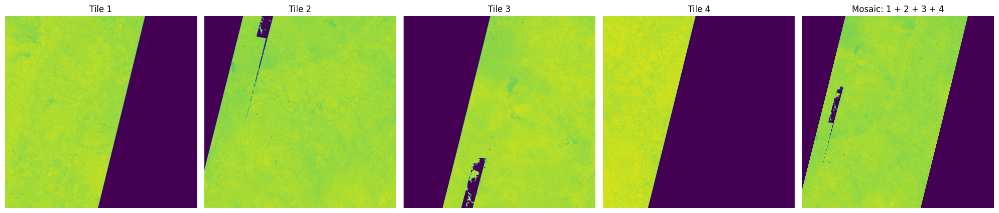


Processing date: 2023-07-10 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016017_20230710_20230721_02_ST/LC08_CU_016017_20230710_20230721_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015017_20230710_20230721_02_ST/LC08_CU_015017_20230710_20230721_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015016_20230710_20230721_02_ST/LC08_CU_015016_20230710_20230721_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016016_20230710_20230721_02_ST/LC08_CU_016016_20230710_20230721_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC08_CU_2023-07-10 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


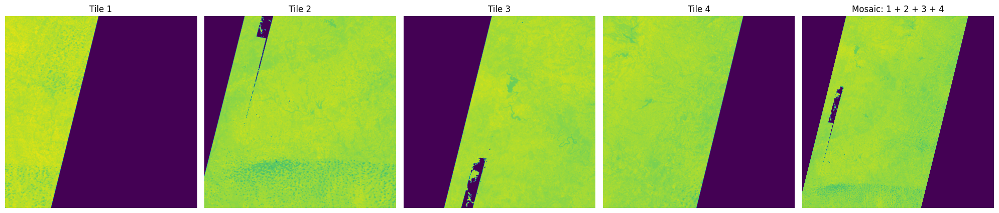


Processing date: 2023-07-18 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015016_20230718_20230723_02_ST/LC09_CU_015016_20230718_20230723_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015017_20230718_20230723_02_ST/LC09_CU_015017_20230718_20230723_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016016_20230718_20230723_02_ST/LC09_CU_016016_20230718_20230723_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016017_20230718_20230723_02_ST/LC09_CU_016017_20230718_20230723_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC09_CU_2023-07-18 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


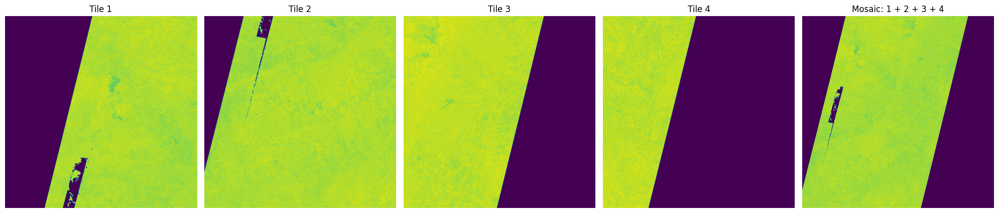


Processing date: 2023-08-11 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015016_20230811_20230822_02_ST/LC08_CU_015016_20230811_20230822_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015017_20230811_20230822_02_ST/LC08_CU_015017_20230811_20230822_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016016_20230811_20230822_02_ST/LC08_CU_016016_20230811_20230822_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016017_20230811_20230822_02_ST/LC08_CU_016017_20230811_20230822_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC08_CU_2023-08-11 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


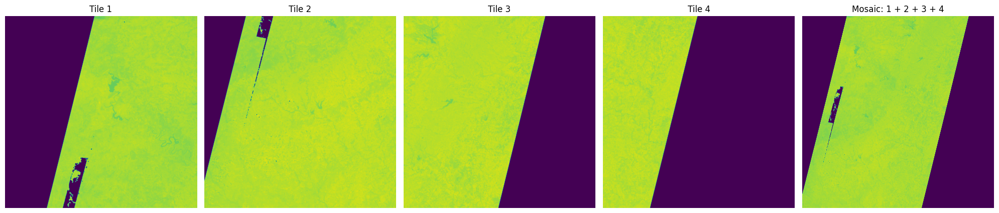


Processing date: 2023-08-19 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016017_20230819_20230824_02_ST/LC09_CU_016017_20230819_20230824_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015016_20230819_20230824_02_ST/LC09_CU_015016_20230819_20230824_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015017_20230819_20230824_02_ST/LC09_CU_015017_20230819_20230824_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016016_20230819_20230824_02_ST/LC09_CU_016016_20230819_20230824_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC09_CU_2023-08-19 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


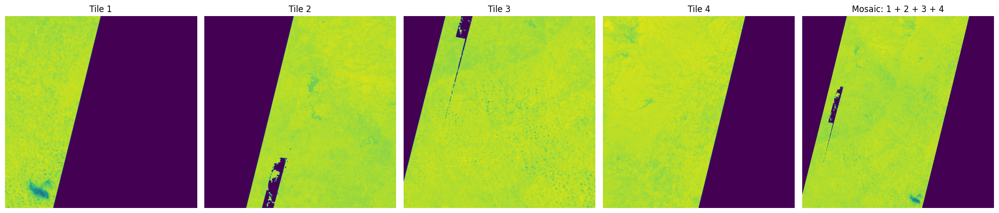


Processing date: 2023-08-27 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015016_20230827_20230909_02_ST/LC08_CU_015016_20230827_20230909_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016017_20230827_20230909_02_ST/LC08_CU_016017_20230827_20230909_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015017_20230827_20230909_02_ST/LC08_CU_015017_20230827_20230909_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016016_20230827_20230909_02_ST/LC08_CU_016016_20230827_20230909_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC08_CU_2023-08-27 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


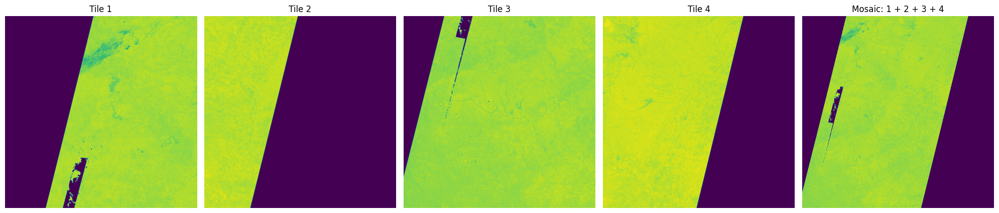


Processing date: 2023-09-20 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016017_20230920_20230925_02_ST/LC09_CU_016017_20230920_20230925_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016016_20230920_20230925_02_ST/LC09_CU_016016_20230920_20230925_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015017_20230920_20230925_02_ST/LC09_CU_015017_20230920_20230925_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015016_20230920_20230925_02_ST/LC09_CU_015016_20230920_20230925_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC09_CU_2023-09-20 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


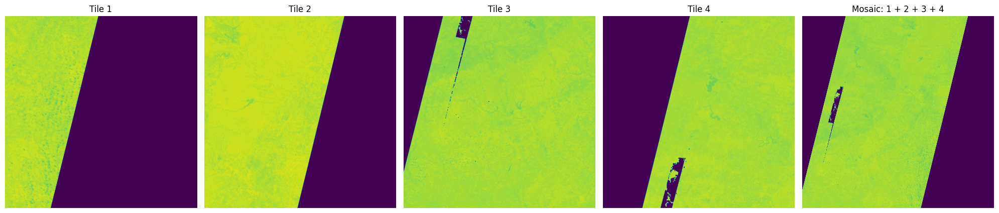


Processing date: 2023-11-15 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015016_20231115_20231125_02_ST/LC08_CU_015016_20231115_20231125_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016016_20231115_20231125_02_ST/LC08_CU_016016_20231115_20231125_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015017_20231115_20231125_02_ST/LC08_CU_015017_20231115_20231125_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016017_20231115_20231125_02_ST/LC08_CU_016017_20231115_20231125_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC08_CU_2023-11-15 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


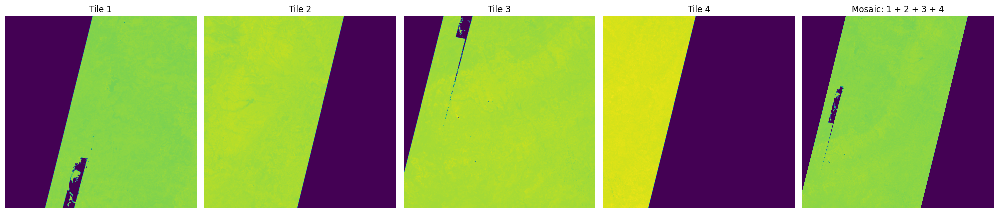


Processing date: 2024-01-10 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016017_20240110_20240116_02_ST/LC09_CU_016017_20240110_20240116_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015017_20240110_20240116_02_ST/LC09_CU_015017_20240110_20240116_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_016016_20240110_20240116_02_ST/LC09_CU_016016_20240110_20240116_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC09_CU_015016_20240110_20240116_02_ST/LC09_CU_015016_20240110_20240116_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC09_CU_2024-01-10 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


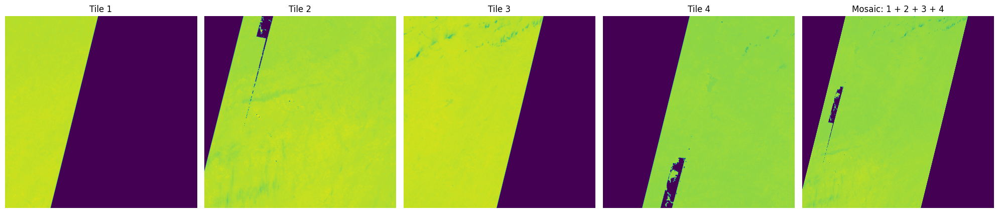


Processing date: 2024-02-19 00:00:00
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016017_20240219_20240304_02_ST/LC08_CU_016017_20240219_20240304_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015017_20240219_20240304_02_ST/LC08_CU_015017_20240219_20240304_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_016016_20240219_20240304_02_ST/LC08_CU_016016_20240219_20240304_02_ST_B10.TIF - Height: 5000, Width: 5000
Tile ./Data/surface_temperature_4_tiles/LC08_CU_015016_20240219_20240304_02_ST/LC08_CU_015016_20240219_20240304_02_ST_B10.TIF - Height: 5000, Width: 5000
Mosaic saved to ./Data/UHI_analysis/input/LC08_CU_2024-02-19 00:00:00_ST_B10.tif - Height: 10000, Width: 10000


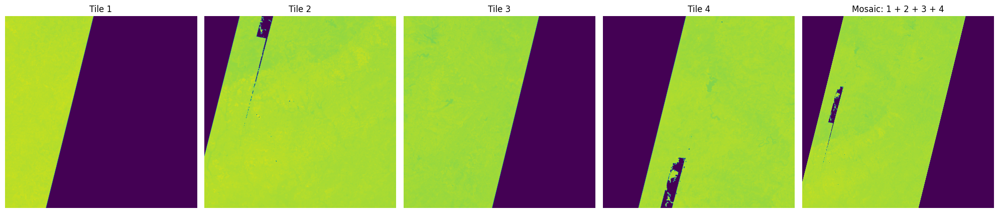

In [252]:
uhi_files_grouped = group_files_for_full_coverage_list(temperature_4tilesdir, FullCoverageList, "_B10")
mosaic_and_visualize_selected_data(uhi_files_grouped,os.path.join(output_dirs["UHI"], "input"), 'B10', 'ST', True)


#### mosaic for NDVI

In [254]:
ndvi_files_grouped_B4 = group_files_for_full_coverage_list(reflectance_4tilesdir, FullCoverageList, "_B4")
mosaic_and_visualize_selected_data(ndvi_files_grouped_B4,os.path.join(output_dirs["NDVI"], "input"), 'B4', 'SR', False)
ndvi_files_grouped_B5 = group_files_for_full_coverage_list(reflectance_4tilesdir, FullCoverageList, "_B5")
mosaic_and_visualize_selected_data(ndvi_files_grouped_B5,os.path.join(output_dirs["NDVI"], "input"), 'B5', 'SR', False)
print('Copy NDVI inputs finished.')

Mosaic saved to ./Data/NDVI_analysis/input/LC09_CU_2023-06-16 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/NDVI_analysis/input/LC08_CU_2023-07-10 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/NDVI_analysis/input/LC09_CU_2023-07-18 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/NDVI_analysis/input/LC08_CU_2023-08-11 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/NDVI_analysis/input/LC09_CU_2023-08-19 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/NDVI_analysis/input/LC08_CU_2023-08-27 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/NDVI_analysis/input/LC09_CU_2023-09-20 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/NDVI_analysis/input/LC08_CU_2023-11-15 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/NDVI_analysis/input/LC09_CU_2024-01-10 00:00:00_SR_B4.tif - Height: 10000, Width: 10000
M

#### mosaic for Land Cover Classification (LCC)

In [399]:
# # Process Land Cover Classification (Bands 1-7)
# Group files for LCC using Bands 1 through 7
lcc_files_grouped = group_files_for_full_coverage_list(reflectance_4tilesdir, FullCoverageList, "_B")

for band_index in range(1, 8):
    lcc_files_grouped = group_files_for_full_coverage_list(reflectance_4tilesdir, FullCoverageList, f"_B{band_index}")
    mosaic_and_visualize_selected_data(
                    lcc_files_grouped,
                    os.path.join(output_dirs["LCC"], "input") ,
                    f"B{band_index}",'SR', False
                )        
print('Copy LCC inputs finished.')

Mosaic saved to ./Data/LCC_analysis/input/LC09_CU_2023-06-16 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/LCC_analysis/input/LC08_CU_2023-07-10 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/LCC_analysis/input/LC09_CU_2023-07-18 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/LCC_analysis/input/LC08_CU_2023-08-11 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/LCC_analysis/input/LC09_CU_2023-08-19 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/LCC_analysis/input/LC08_CU_2023-08-27 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/LCC_analysis/input/LC09_CU_2023-09-20 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/LCC_analysis/input/LC08_CU_2023-11-15 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic saved to ./Data/LCC_analysis/input/LC09_CU_2024-01-10 00:00:00_SR_B1.tif - Height: 10000, Width: 10000
Mosaic sav

#### mosaic for land classification

Tile ./Data/Land_Cover/Annual_NLCD_H16V16_LndCov_2023_CU_C1V0.tif - Height: 5000, Width: 5000
Tile ./Data/Land_Cover/Annual_NLCD_H15V17_LndCov_2023_CU_C1V0.tif - Height: 5000, Width: 5000
Tile ./Data/Land_Cover/Annual_NLCD_H16V17_LndCov_2023_CU_C1V0.tif - Height: 5000, Width: 5000
Tile ./Data/Land_Cover/Annual_NLCD_H15V16_LndCov_2023_CU_C1V0.tif - Height: 5000, Width: 5000
[11 21 22 23 24 31 41 42 43 52 71 81 82 90 95]
Mosaic saved to ./Data/Land_Cover/output/Annual_NLCD_Mosaic_2023.tif


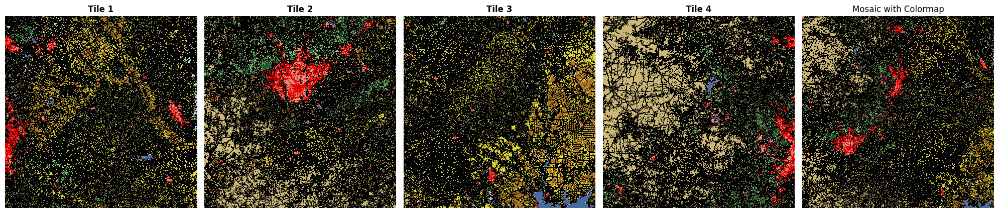

In [21]:


def mosaic_and_save_with_colormap(files, output_file):
    # Open source files
    src_files_to_mosaic = [rasterio.open(fp) for fp in files]
    
    # Print dimensions of each tile for debugging
    for src in src_files_to_mosaic:
        print(f"Tile {src.name} - Height: {src.height}, Width: {src.width}")

    # Merge the source tiles
    mosaic, transform = merge(src_files_to_mosaic)
    print(np.unique(mosaic))

    # print(f"Mosaic shape: {mosaic.shape}")

    # Copy metadata from the first file
    meta = src_files_to_mosaic[0].meta.copy()
    meta.update({
        "driver": "GTiff",
        "height": mosaic.shape[1],
        "width": mosaic.shape[2],
        "transform": transform,
        "count": 1,  # Assuming a single-band dataset for NLCD
        "dtype": mosaic.dtype,
        # "photometric": "PALETTE",  # Set photometric interpretation to palette (color map)
    })

    # Save the mosaic with the colormap
    os.makedirs(os.path.dirname(output_file), exist_ok=True)
    with rasterio.open(output_file, "w", **meta) as dest:
        dest.write(mosaic[0], 1)
        # Copy colormap from the first file
        colormap = src_files_to_mosaic[0].colormap(1)
        dest.write_colormap(1, colormap)
    
    print(f"Mosaic saved to {output_file}")

    # Visualize the mosaic with the preserved colormap
    fig, axes = plt.subplots(1, len(files) + 1, figsize=(20, 7))
    
    # Visualize individual tiles
    for i, src in enumerate(src_files_to_mosaic):        
        tile_data = src.read(1)
        tile_colormap = src.colormap(1)
        
        class_values = sorted(tile_colormap.keys())  # e.g. [11, 12, 21, 22,...]
        indexed_colors = [tile_colormap[val] for val in class_values]
        indexed_colors = [(r/255, g/255, b/255, a/255) for r,g,b,a in indexed_colors]        
        cmap = ListedColormap(indexed_colors)
        # method 1: Create a BoundaryNorm so that each class maps to exactly one color, and show with "show"
        boundaries = [val - 0.5 for val in class_values] + [class_values[-1] + 0.5]        
        norm = BoundaryNorm(boundaries, ncolors=len(class_values))                
        show(src, ax=axes[i], title=f"Tile {i+1}", cmap=cmap, norm=norm)
        # method 2: Create a new array with zero-based indices, and show with "matplotlib.imshow"
        # value_to_index = {val: i for i, val in enumerate(class_values)}             
        # indexed_data = np.copy(tile_data)
        # for val, idx in value_to_index.items():
        #     indexed_data[tile_data == val] = idx        
        # axes[i].imshow(indexed_data, cmap=cmap, vmin=0, vmax=len(class_values)-1)
        axes[i].axis('off')

    # Visualize the mosaic with colormap
    with rasterio.open(output_file) as mosaic_src:
        mosaic_data = mosaic_src.read(1)
        mosaic_colormap = mosaic_src.colormap(1)
        mosaic_cmap = ListedColormap([mosaic_colormap[k] for k in range(len(mosaic_colormap))])
        show(mosaic_data, ax=axes[-1], title=f"Mosaic", cmap=cmap, norm=norm)
        axes[-1].imshow(mosaic_data, cmap=mosaic_cmap)
        axes[-1].set_title("Mosaic with Colormap")
        axes[-1].axis('off')
    
    plt.tight_layout()
    plt.show()


nlcd_files = glob.glob(os.path.join(LandCover_dir, "Annual_NLCD_*_C1V0.tif"))
output_mosaic_file = os.path.join(LandCover_dir, "output", "Annual_NLCD_Mosaic_2023.tif")
mosaic_and_save_with_colormap(nlcd_files, output_mosaic_file)


### Visualize Categories

/tmp/ipykernel_1071441/473908520.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



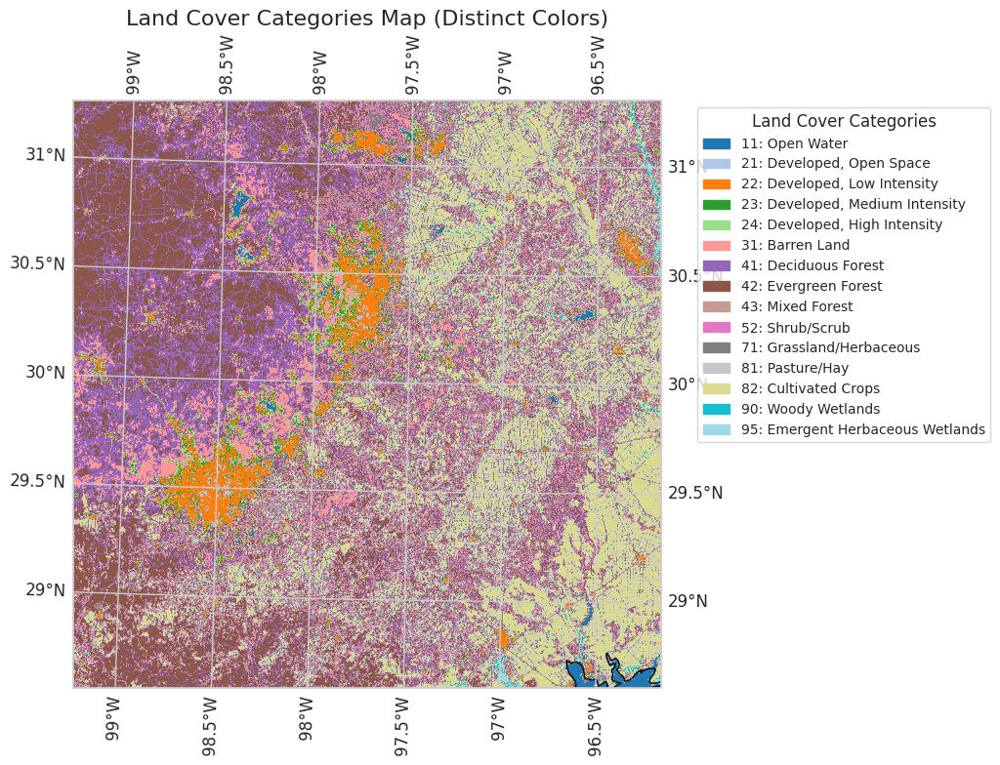

In [224]:
# Generate a colormap using 'RdYlGn_r'
# Define category labels and colors
category_labels = {
    11: "Open Water", 21: "Developed, Open Space", 22: "Developed, Low Intensity",
    23: "Developed, Medium Intensity", 24: "Developed, High Intensity",
    31: "Barren Land", 41: "Deciduous Forest", 42: "Evergreen Forest",
    43: "Mixed Forest", 52: "Shrub/Scrub", 71: "Grassland/Herbaceous",
    81: "Pasture/Hay", 82: "Cultivated Crops", 90: "Woody Wetlands",
    95: "Emergent Herbaceous Wetlands"
}
categories = list(category_labels.keys())
colors = cm.get_cmap('tab20', len(categories)).colors  # Use a diverse colormap
color_map0 = ListedColormap(colors)
handles = [
    mpatches.Patch(color=colors[i], label=f"{code}: {label}")
    for i, (code, label) in enumerate(category_labels.items())
]


# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': aea_proj})

# Set map extent to match the region of interest
ax.set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)

# Plot category data with updated colormap
im = ax.imshow(
    category_data, transform=aea_proj,
    extent=plotting_extent(src),
    cmap=color_map0
)

# Add geographic features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle='--')
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS, alpha=0.5)
ax.gridlines(draw_labels=True)

# Add a legend
plt.legend(handles=handles, title="Land Cover Categories", bbox_to_anchor=(1.05, 1), loc="upper left", fontsize="small")

# Add title
plt.title("Land Cover Categories Map (Distinct Colors)", fontsize=16)

# Display the plot
plt.tight_layout()
plt.show()

`I tried many colormap code, they are still some categories very close. Now is the customize colormap after many efforts.`

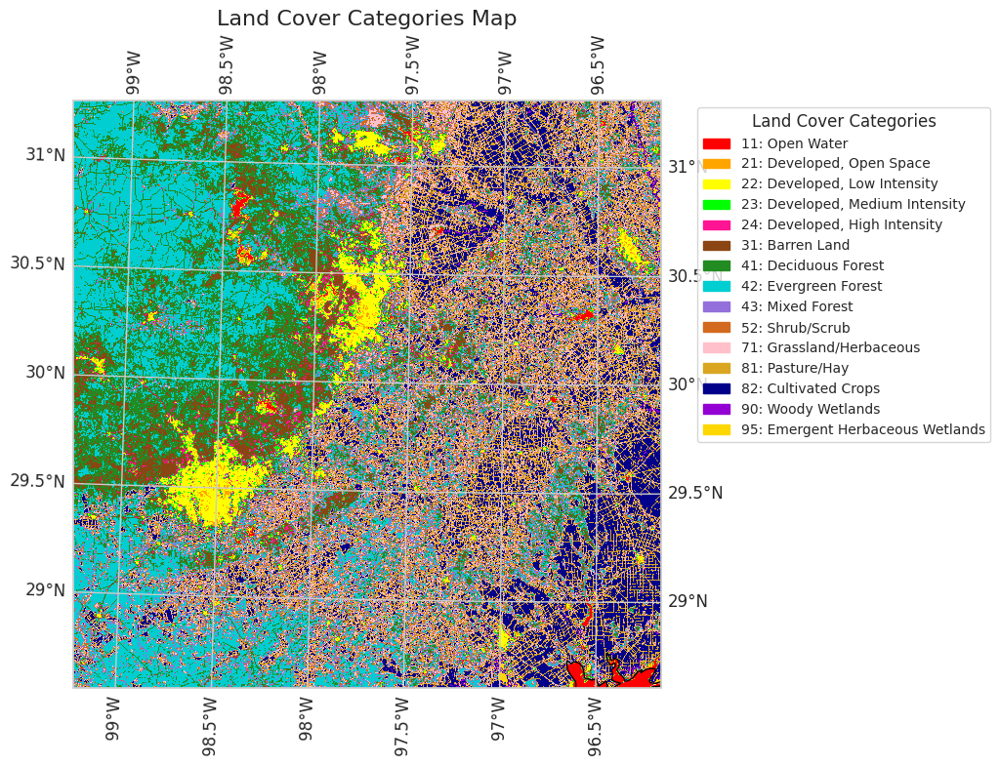

In [381]:

colors = [
    "#FF0000",  # Bright Red for Open Water
    "#FFA500",  # Orange for Developed, Open Space
    "#FFFF00",  # Yellow for Developed, Low Intensity
    "#00FF00",  # Bright Green for Developed, Medium Intensity
    "#FF1493",  # Deep Pink for Developed, High Intensity (updated)
    "#8B4513",  # SaddleBrown for Barren Land
    "#228B22",  # Forest Green for Deciduous Forest (kept distinct)
    "#00CED1",  # Dark Turquoise for Evergreen Forest
    "#9370DB",  # Medium Purple for Mixed Forest
    "#D2691E",  # Chocolate for Shrub/Scrub
    "#FFC0CB",  # Pink for Grassland/Herbaceous
    "#DAA520",  # Goldenrod for Pasture/Hay
    "#00008B",  # Dark Blue for Cultivated Crops
    "#9400D3",  # Dark Violet for Woody Wetlands
    "#FFD700",  # Gold for Emergent Herbaceous Wetlands
]



color_map = ListedColormap(colors)

# Add legend handles
handles = [
    mpatches.Patch(color=colors[i], label=f"{code}: {label}")
    for i, (code, label) in enumerate(category_labels.items())
]

# Load category data
with rasterio.open(output_mosaic_file) as src:
    category_data = src.read(1)
    bounds = src.bounds
    transform = src.transform

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': aea_proj})

# Set map extent to match the region of interest
ax.set_extent([bounds.left, bounds.right, bounds.bottom, bounds.top], crs=aea_proj)

im = ax.imshow(
    category_data, transform=aea_proj,
    extent=plotting_extent(src),
    cmap=color_map
)

# Add geographic features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle='--')
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS, alpha=0.5)
ax.gridlines(draw_labels=True)

plt.legend(handles=handles, title="Land Cover Categories", bbox_to_anchor=(1.05, 1), loc="upper left", fontsize="small")

# Add title
plt.title("Land Cover Categories Map", fontsize=16)

# Display the plot
plt.tight_layout()
plt.show()


## Acknowledgments

- Datasets: Downloaded from USGS, the public data gives so much value to the academic society.
- Python libraries: the people who contributes to the open source software makes things much easier
- ChatGPT: it helps so much in the research's every step
